In [1]:
import time
from time import process_time
# starting process
start_time = time.process_time()

In [2]:
import os

import numpy as np

import pandas as pd
from pandas_datareader import data as pdr
from pandas import (
    read_csv as rcsv,
    read_sql_query as rsqq, 
    Timestamp as tstamp,
)
# Import date and timedelta class
from datetime import date
from datetime import timedelta

import sqlalchemy as sql
from sqlalchemy import (
    create_engine as ce,
    inspect
)

import scipy as sci
from scipy import stats
import scipy.optimize as sco

import matplotlib.pyplot as plt

import yfinance as yf

import hvplot.pandas
import holoviews as hv
import seaborn as sns

from pathlib import Path

from MCForecastTools import MCSimulation
from calculations import MPTCalculations as mpt
from metrics import QuantMetrics as qm
from dataset import DataCollection as ds

import warnings
warnings.filterwarnings('ignore')

print(f"Package imports and dependencies resolved")

Package imports and dependencies resolved


### Portfolio Analysis and Optimization with Post-Modern Portfolio Theory (PMPT)

---
Steps Involved:
1. Project Settings
2. Data Preparation (Data Collection, Clean and Format)
3. Quantitative Analysis
4. Visualizations

### 1. Project Settings
- Define the time delta (time-frame) to start with in the historical time reference.

In [3]:
# Specify date range for data
# Set start and end dates of 5 years "5Y" back from your current date
# Define the time delta (time-frame) to start with
time_delta = 7

end_date = pd.to_datetime('today')
# 5 years
start_date = end_date - np.timedelta64(time_delta, 'Y')
start, end = start_date, end_date
# Verify date range
print(f"Start date: {start} and End date: {end}")

Start date: 2015-10-24 23:59:24.024871 and End date: 2022-10-24 16:43:48.024871


### Add or remove stocks of possible sectors
- tech_list or others to evaluate the asset performance
- refer to dataset.py for the entire sector list

In [4]:
# Specify portfolio sectors - basket of market index and assets - S&P 500 Index (^GSPC) and Tech Stocks List
basket_list = ds.market + ds.tech_list + ds.energy_list + ds.industrials_list + ds.financials_list # ds.blend_list 

print("Basket of stocks")
print(basket_list)

Basket of stocks
['^GSPC', 'AAPL', 'IBM', 'TSLA', 'GOOGL', 'MSFT', 'CSCO', 'TSM', 'NVDA', 'DVN', 'OXY', 'NEE', 'MRO', 'APA', 'TRGP', 'PSX', 'EQT', 'BA', 'GE', 'CNI', 'NOC', 'LPX', 'BLDR', 'AAL', 'CPA', 'CAR', 'CPA', 'HXL', 'BHF', 'AIG', 'EQH', 'PFG', 'WBS', 'UNM', 'FHN', 'LPLA']


### 2. Data Preparation

In [5]:
# Dataframe closing prices of basket, i.e. market index and assets
# Fetch data from Yahoo Finance API
stock_data, raw_data = ds.get_raw_data(basket_list, start, end)
stock_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)
stock_data = stock_data.reset_index()
raw_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)

#### Raw Data dataframe

In [6]:
# Output raw data is raw_frame_close
display(raw_data.shape)
# Review random 5 rows from dataframe
display(raw_data.sample(5))

(1762, 210)

Attributes    Adj Close                                                  \
Symbols     SP500_index        AAPL         IBM        TSLA       GOOGL   
Date                                                                      
2022-08-22  4137.990234  167.570007  135.550003  289.913330  114.239998   
2019-01-15  2610.300049   36.996132   96.856331   22.962000   54.325500   
2019-06-24  2945.350098   48.387100  113.500183   14.909333   55.834999   
2018-10-04  2901.610107   54.912270  118.878067   18.788668   58.853500   
2021-04-16  4185.470215  132.986938  118.799362  246.593338  114.137497   

Attributes                                                            ...  \
Symbols           MSFT       CSCO         TSM        NVDA        DVN  ...   
Date                                                                  ...   
2022-08-22  277.750000  47.270916   84.760620  170.289398  66.881020  ...   
2019-01-15  100.884880  39.287231   32.483231   37.202480  21.830822  ...   
2019-06-24  133.424957  51.355461   37.206039   37.977402  23.232958  ...   
2018-10-04  107.893181  42.846710   38.242615   69.259323  33.095436  ...   
2021-04-16  257.485779  50.497532  115.586372  158.933075  19.724016  ...   

Attributes     Volume                                                        \
Symbols           CAR       HXL        BHF        AIG        EQH        PFG   
Date                                                                          
2022-08-22   919600.0  841300.0   417800.0  3735000.0  2590600.0  1200700.0   
2019-01-15  1009000.0  321800.0  1309000.0  5341400.0  1399700.0  1681100.0   
2019-06-24   831400.0  441800.0   659100.0  2745200.0  2270700.0  1194400.0   
2018-10-04  1244200.0  746100.0  1144900.0  4804500.0  1916700.0  2059300.0   
2021-04-16   830400.0  504600.0   394700.0  4369100.0  2088900.0  1489400.0   

Attributes                                             
Symbols           WBS        UNM        FHN      LPLA  
Date                                                   
2022-08-22   499200.0  1050900.0  4470600.0  619400.0  
2019-01-15   561800.0  1217400.0  2864700.0  476500.0  
2019-06-24   279400.0  1593000.0  2622100.0  850500.0  
2018-10-04  1083000.0  3337200.0  3550700.0  492800.0  
2021-04-16   326800.0  2341100.0  3254600.0  491500.0  

[5 rows x 210 columns]

#### Cleaned Stock Data dataframe - close prices

In [7]:
# Output cleaned data to 'Close' prices is stock_data, cut table down to 36 columns from 210 columns
display(stock_data.shape)
print("Review random 5 rows from dataframe")
# Review random 5 rows from dataframe
display(stock_data.sample(5))

(1762, 36)

Review random 5 rows from dataframe


Symbols,Date,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
610,2018-03-29,2640.870117,41.945000,146.682602,17.742001,51.856998,91.269997,42.889999,43.759998,57.897499,...,46.840000,64.589996,51.400002,54.419998,NaN,60.910000,55.400002,47.610001,18.83,61.070000
1359,2021-03-22,3940.590088,123.389999,124.808792,223.333328,101.534500,235.990005,50.299999,117.180000,131.862503,...,67.629997,59.250000,44.419998,46.230000,32.389999,59.570000,57.990002,27.250000,17.01,144.779999
1026,2019-11-21,3103.540039,65.502502,127.954109,23.655333,65.007004,149.479996,44.840000,52.980000,52.544998,...,28.709999,78.120003,39.630001,52.209999,24.000000,54.340000,47.540001,29.959999,16.02,89.750000
1536,2021-12-01,4513.040039,164.770004,116.919998,365.000000,141.051498,330.079987,55.029999,120.629997,314.350006,...,253.270004,49.040001,46.990002,51.720001,30.590000,67.760002,52.610001,22.379999,15.75,154.729996
15,2015-11-16,2053.189941,28.545000,127.829826,14.287333,37.521000,53.770000,26.790001,22.350000,7.600000,...,39.709999,45.049999,NaN,60.660000,NaN,49.700001,37.910000,36.590000,14.75,44.110001


#### Confirm and review raw data storage in csv file

In [8]:
# Import the [~offline stored] data from the csv file
# Generate dataframe setting the DatetimeIndex with 'date' as as index. 
working_raw_data = rcsv(
    Path('data/raw_frame_close.csv'),
    index_col=0,
    parse_dates=True,
    infer_datetime_format=True,
    header = [0,1]
)

# Output dataframe name is working_raw_frame_close
print('Sample row of DataFrame from local csv data source path:')
display(working_raw_data.shape)

# Display sample 5 rows of dataframe
display(working_raw_data.sample(5))

Sample row of DataFrame from local csv data source path:


(1762, 210)

Attributes    Adj Close                                                  \
Symbols           ^GSPC        AAPL         IBM        TSLA       GOOGL   
Date                                                                      
2015-12-09  2047.619995   26.505898   96.434486   14.968000   38.127499   
2017-04-10  2357.159912   33.697460  126.449043   20.826000   42.084999   
2019-04-01  2867.189941   46.419838  115.347298   19.278667   59.949001   
2022-01-20  4482.729980  163.832047  126.124649  332.089996  133.307495   
2020-01-29  3273.399902   79.568932  114.809723   38.732666   72.834999   

Attributes                                                            ...  \
Symbols           MSFT       CSCO         TSM        NVDA        DVN  ...   
Date                                                                  ...   
2015-12-09   49.430977  21.436541   18.447884    7.988842  28.142862  ...   
2017-04-10   60.899841  27.868845   27.384192   24.138580  35.120785  ...   
2019-04-01  114.832870  49.068871   37.287216   45.294300  26.152554  ...   
2022-01-20  299.642273  56.644257  126.330406  241.336105  45.988670  ...   
2020-01-29  163.825943  43.161068   53.979660   61.188847  18.603159  ...   

Attributes     Volume                                                        \
Symbols           CAR       HXL        BHF        AIG        EQH        PFG   
Date                                                                          
2015-12-09  2349700.0  386300.0        NaN  7548400.0        NaN  1915400.0   
2017-04-10  2543300.0  319800.0        NaN  4760900.0        NaN   711300.0   
2019-04-01  1305100.0  867200.0  2654800.0  3715100.0  2889500.0  1417200.0   
2022-01-20   852900.0  638900.0   534900.0  5861700.0  2055000.0  1673100.0   
2020-01-29   456200.0  402600.0   521800.0  2964400.0  2175700.0  1638000.0   

Attributes                                             
Symbols           WBS        UNM        FHN      LPLA  
Date                                                   
2015-12-09   712000.0   865400.0  2809600.0  683200.0  
2017-04-10   425500.0  1255700.0  3598800.0  274100.0  
2019-04-01   603300.0  2037200.0  3134500.0  628400.0  
2022-01-20  1967700.0  1584300.0  9771600.0  446800.0  
2020-01-29   652100.0  1639400.0  3423100.0  461900.0  

[5 rows x 210 columns]

#### Clean, confirm, and review sample from csv raw data

In [9]:
# Verify Close columns of each stocks and index
working_raw_data['Close']

Symbols,^GSPC,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-26,2071.179932,28.820000,137.342255,14.350667,36.556000,54.250000,28.950001,22.160000,7.115000,42.790001,...,49.990002,45.919998,NaN,61.160000,NaN,50.590000,37.080002,33.340000,13.950000,41.119999
2015-10-27,2065.889893,28.637501,131.797318,14.023333,36.640999,53.689999,29.049999,22.200001,7.110000,41.200001,...,48.630001,45.790001,NaN,60.919998,NaN,48.990002,36.830002,32.959999,13.780000,40.470001
2015-10-28,2090.350098,29.817499,134.636703,14.197333,36.846001,53.980000,29.360001,22.080000,7.167500,41.560001,...,49.889999,47.230000,NaN,63.889999,NaN,51.000000,38.459999,34.130001,14.500000,41.209999
2015-10-29,2089.409912,30.132500,134.369019,14.108667,37.242500,53.360001,29.139999,21.820000,6.920000,41.040001,...,49.869999,46.869999,NaN,63.490002,NaN,50.799999,38.139999,34.610001,14.500000,42.910000
2015-10-30,2079.360107,29.875000,133.919693,13.795333,36.869499,52.639999,28.850000,21.959999,7.092500,41.930000,...,49.939999,46.320000,NaN,63.060001,NaN,50.160000,37.099998,34.650002,14.180000,42.599998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-18,3719.979980,143.750000,122.940002,220.190002,100.769997,238.500000,41.790001,63.709999,119.669998,69.769997,...,184.960007,56.139999,51.419998,52.599998,28.780001,79.879997,49.549999,43.060001,24.000000,242.100006
2022-10-19,3695.159912,143.860001,122.510002,222.039993,99.629997,236.479996,41.880001,63.660000,120.510002,71.940002,...,180.199997,56.250000,50.570000,52.750000,28.139999,78.769997,48.549999,43.099998,24.070000,237.059998
2022-10-20,3665.780029,143.389999,128.300003,207.279999,99.970001,236.149994,41.709999,63.580002,121.940002,71.680000,...,180.529999,55.529999,49.779999,51.849998,27.440001,77.559998,49.529999,42.459999,24.040001,235.270004


### Create 'basket' from SQLite temp db

In [10]:
# Fetch date indexed and unindexed data frames created out of SQLite temp db
sql_basket_indexed_df, sql_basket_df = ds.sqlite_data(stock_data)

print("Unindexed dataframe counts and column summary")
display(sql_basket_df.shape) 
# Display sample 5 rows of unindexed dataframe
display(sql_basket_df.sample(5))

print("Indexed dataframe counts and column summary")
display(sql_basket_indexed_df.shape) 

# Display sample 5 rows of indexed datafarme
display(sql_basket_indexed_df.sample(5))

Unindexed dataframe counts and column summary


(1762, 36)

,Date,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
1601,2022-03-07,4201.089844,159.300003,126.070000,268.193329,126.378502,278.910004,55.590000,99.290001,213.520004,...,162.300003,50.580002,43.430000,54.669998,28.520000,64.370003,52.189999,26.350000,23.450001,143.669998
354,2017-03-23,2345.959961,35.230000,167.131927,16.985332,41.982498,64.870003,33.959999,32.560001,26.772499,...,28.559999,53.160000,NaN,61.340000,NaN,62.180000,50.380001,46.070000,18.200001,39.389999
1568,2022-01-18,4577.109863,169.800003,132.940002,343.503326,135.998001,302.649994,59.730000,133.830002,259.029999,...,192.889999,56.160000,55.950001,60.900002,35.060001,75.800003,63.439999,27.660000,18.309999,169.100006
892,2019-05-14,2834.409912,47.165001,127.447418,15.487333,56.243000,124.730003,52.020000,41.970001,40.509998,...,33.230000,69.680000,37.830002,51.480000,21.280001,55.279999,49.880001,35.320000,14.350000,81.980003
309,2017-01-18,2271.889893,29.997499,159.464630,15.890667,41.451000,62.500000,30.030001,29.490000,25.737499,...,37.410000,50.820000,NaN,66.239998,NaN,59.480000,52.240002,44.490002,19.480000,38.160000


Indexed dataframe counts and column summary


(1762, 35)

,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-11,3357.750000,79.902496,146.730408,51.625332,75.502998,184.440002,49.130001,58.660000,66.972504,22.700001,...,38.599998,73.220001,46.599998,54.470001,26.900000,56.340000,46.880001,29.650000,16.620001,95.970001
2015-12-30,2063.360107,26.830000,133.212234,15.872667,39.514999,56.310001,27.530001,22.879999,8.347500,31.000000,...,35.950001,46.430000,NaN,62.509998,NaN,45.470001,37.619999,33.520000,14.710000,42.959999
2016-12-29,2249.260010,29.182501,159.273422,14.312000,40.144001,62.900002,30.459999,29.129999,27.857500,45.950001,...,37.200001,51.700001,NaN,65.500000,NaN,57.849998,54.270000,43.810001,20.040001,34.660000
2018-09-28,2913.979980,56.435001,144.560226,17.651333,60.354000,114.370003,48.650002,44.160000,70.254997,39.939999,...,32.139999,67.050003,44.240002,53.240002,21.450001,58.590000,58.959999,39.070000,17.260000,64.510002
2017-10-23,2564.979980,39.042500,152.533463,22.468000,49.277000,78.830002,34.349998,41.209999,49.154999,34.650002,...,41.000000,62.900002,61.730000,64.959999,NaN,68.269997,54.439999,52.360001,19.020000,52.869999


### 3. Quant Analysis

In [11]:
# Display constants being used in quant analysis
print("Number of trading days per year = ", qm.num_trading_days)
print("Risk free rate = ", qm.risk_free_rate)
print("Number of random portfolio runs = ", qm.num_random_portfolio_run)
print("Number of days in rolling window = ", qm.rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", mpt.historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", mpt.test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.03
Number of random portfolio runs =  10000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.9217
Number of days of input dataframe to use as test/experiment data  =  0.07830000000000004


In [12]:
display(sql_basket_indexed_df.shape)

(1762, 35)

In [63]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = sql_basket_indexed_df.shape[0]
num_historical_days_percent = round(num_days_total * mpt.historical_days_percent)
num_test_days_percent = round(num_days_total * mpt.test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data sample = ", num_historical_days_percent)
print("Total # of days will use for [back] testing results = ", num_test_days_percent)


# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = sql_basket_indexed_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = sql_basket_indexed_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  1762
Total # of days will use for hisotrical data sample =  1624
Total # of days will use for [back] testing results =  138


In [14]:
# Plot the individual asset prices taking previous 5.6 years (80% of 7 years period)
asset_mkt_prices_historical_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(In-Sample) Performance of Historical Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [15]:
# Plot the individual asset prices in the next 1.4 year (20% of 7 years period)
asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(Out-of-Sample) Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

#### Calculate Descriptive Stats
---
* Asset Returns, Standard Deviation, Cumulative Returns, Covariance, Correlation Matrix, Sharpe Ratio

In [16]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [17]:
# Review daily returns DataFrame
print("Asset Returns:")
display(asset_mkt_prices_returns_df.shape)
# Display randow 5 rows of the returns
display(asset_mkt_prices_returns_df.sample(5))

Asset Returns:


(983, 35)

,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2021-08-11,0.001276,0.001786,0.005305,-0.003056,-0.003859,0.001781,0.004496,-0.003180,-0.011888,0.012658,...,0.004661,0.019577,0.027915,0.017689,0.011043,0.019178,0.006596,0.017466,0.021157,0.009290
2019-08-02,-0.007283,-0.021158,-0.020423,0.002095,-0.012758,-0.008402,-0.038635,-0.005254,-0.022617,-0.005167,...,-0.015027,-0.018699,-0.032709,-0.006946,-0.020360,-0.007361,-0.027163,-0.007355,0.001260,-0.011333
2020-03-04,0.042203,0.046385,0.041272,0.005352,0.032802,0.036715,0.033716,0.040087,0.070029,0.029766,...,-0.034080,0.039365,0.026054,0.025307,0.030072,0.033296,0.023162,0.014041,0.020543,-0.037130
2019-03-20,-0.002944,0.008739,-0.006335,0.022918,0.019934,-0.001105,-0.000938,0.002264,-0.007456,0.033399,...,-0.009193,-0.008351,-0.052330,-0.020520,-0.025245,-0.023878,-0.041477,-0.047960,-0.030997,-0.021780
2019-08-13,0.015132,0.042348,0.015860,0.026156,0.018927,0.020694,0.022895,0.021484,0.030373,0.004679,...,-0.006458,0.019149,0.041790,0.018882,0.016659,0.022315,0.016684,0.017857,0.009615,0.028654


In [18]:
# Plot the distribution of the returns of the individual assets
asset_mkt_prices_returns_df.hvplot.hist(
    bins=100, 
    subplots=True, 
    width=400, 
    group_label='Ticker', 
    grid=True
).cols(3)

:NdLayout   [Default]
   :Histogram   [LPLA]   (LPLA_count)

In [19]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

<AxesSubplot:title={'center':'Asset & Market: Daily Returns Box Plot'}>

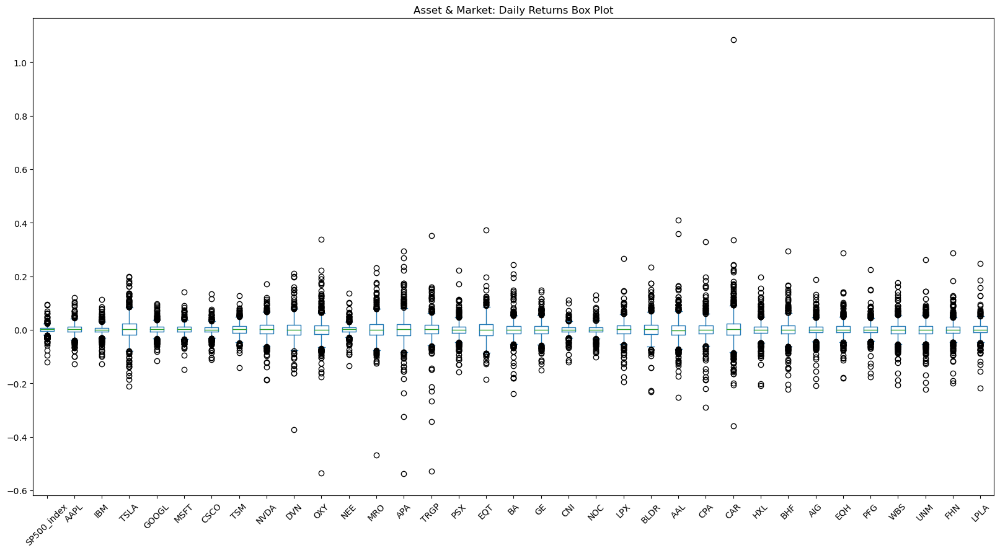

In [20]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.plot.box(
    figsize=(20, 10), 
    rot=45, 
    title = "Asset & Market: Daily Returns Box Plot"
)

In [21]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


SP500_index    0.214675
CNI            0.260655
NEE            0.272207
IBM            0.282388
NOC            0.289902
CSCO           0.290325
GOOGL          0.295887
MSFT           0.300187
AAPL           0.331744
TSM            0.347564
PFG            0.406822
AIG            0.427459
LPLA           0.429361
PSX            0.435125
EQH            0.439654
GE             0.458518
LPX            0.471768
HXL            0.473829
FHN            0.474248
WBS            0.479510
UNM            0.490231
NVDA           0.502493
BA             0.526001
BLDR           0.541143
BHF            0.562455
CPA            0.582779
EQT            0.621294
MRO            0.627823
DVN            0.628708
AAL            0.648054
TRGP           0.649236
TSLA           0.668172
OXY            0.679801
APA            0.755752
CAR            0.969540
dtype: float64

In [22]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 1000,
    height = 500,
    hover_color = 'magenta',
    rot = 45,
    title = "Assets & Market: Annual Sharpe Ratio"
)

Assets & Market: Annual Sharpe Ratio (Sorted):


BA            -0.045578
AAL           -0.024654
PSX            0.029868
IBM            0.080877
GE             0.102106
HXL            0.125407
CPA            0.136486
UNM            0.144988
WBS            0.147457
OXY            0.210737
CSCO           0.296279
BHF            0.309670
AIG            0.317784
FHN            0.351759
PFG            0.351830
MRO            0.395551
APA            0.407206
EQT            0.408092
NOC            0.436583
DVN            0.466894
EQH            0.474147
TRGP           0.543787
CNI            0.595504
LPX            0.679088
SP500_index    0.714603
LPLA           0.801872
BLDR           0.833120
NEE            0.859556
TSM            0.872137
CAR            0.914480
GOOGL          0.957045
NVDA           0.959185
MSFT           1.137400
AAPL           1.174428
TSLA           1.440077
dtype: float64

:Bars   [index]   (0)

In [23]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['SP500_index'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df)

market_df = pd.DataFrame(asset_mkt_prices_returns_df['SP500_index'])

# Recompute frequence components (e.g. covariance matrix will be different).
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-26,28.820000,137.342255,14.350667,36.556000,54.250000,28.950001,22.160000,7.115000,42.790001,71.538177,...,49.990002,45.919998,NaN,61.160000,NaN,50.590000,37.080002,33.340000,13.950000,41.119999
2015-10-27,28.637501,131.797318,14.023333,36.640999,53.689999,29.049999,22.200001,7.110000,41.200001,70.080658,...,48.630001,45.790001,NaN,60.919998,NaN,48.990002,36.830002,32.959999,13.780000,40.470001
2015-10-28,29.817499,134.636703,14.197333,36.846001,53.980000,29.360001,22.080000,7.167500,41.560001,73.684525,...,49.889999,47.230000,NaN,63.889999,NaN,51.000000,38.459999,34.130001,14.500000,41.209999
2015-10-29,30.132500,134.369019,14.108667,37.242500,53.360001,29.139999,21.820000,6.920000,41.040001,74.003983,...,49.869999,46.869999,NaN,63.490002,NaN,50.799999,38.139999,34.610001,14.500000,42.910000
2015-10-30,29.875000,133.919693,13.795333,36.869499,52.639999,28.850000,21.959999,7.092500,41.930000,74.413284,...,49.939999,46.320000,NaN,63.060001,NaN,50.160000,37.099998,34.650002,14.180000,42.599998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-30,177.770004,132.130005,364.663330,141.938507,313.859985,56.049999,106.730003,276.899994,60.560001,57.480000,...,256.450012,59.840000,52.230000,63.490002,31.700001,74.559998,57.689999,31.520000,23.530001,185.699997
2022-03-31,174.610001,130.020004,359.200012,139.067505,308.309998,55.759998,104.260002,272.859985,59.130001,56.740002,...,263.299988,59.470001,51.660000,62.770000,30.910000,73.410004,56.119999,31.510000,23.490000,182.679993
2022-04-01,174.309998,130.149994,361.529999,140.150497,309.420013,55.660000,102.790001,267.119995,60.349998,58.110001,...,260.579987,59.980000,52.410000,63.790001,30.850000,73.889999,55.660000,31.620001,23.549999,183.380005


In [24]:
print("Annual Covariance Matrix:")
display(asset_mkt_prices_ann_cov_mtrx_df.head())

print("Correlation Matrix:")
display(asset_mkt_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
AAPL,0.110054,0.042633,0.096135,0.066371,0.076163,0.057337,0.064849,0.107892,0.068796,0.061279,...,0.079639,0.047592,0.078821,0.051871,0.064067,0.057921,0.055867,0.064356,0.051017,0.065446
IBM,0.042633,0.079743,0.041791,0.039065,0.042065,0.049510,0.039355,0.052728,0.080046,0.082902,...,0.086529,0.062095,0.094447,0.066872,0.072791,0.068159,0.073275,0.083785,0.066052,0.060320
TSLA,0.096135,0.041791,0.446454,0.074304,0.089266,0.050433,0.087512,0.147398,0.104422,0.091468,...,0.145413,0.081752,0.097228,0.070387,0.079436,0.065887,0.072222,0.071828,0.080494,0.093291
GOOGL,0.066371,0.039065,0.074304,0.087549,0.070444,0.048115,0.054112,0.094455,0.071545,0.063407,...,0.085991,0.051433,0.075109,0.052253,0.059836,0.054016,0.053729,0.056574,0.048788,0.063160
MSFT,0.076163,0.042065,0.089266,0.070444,0.090112,0.057054,0.057993,0.105276,0.062238,0.053992,...,0.080491,0.046301,0.073800,0.050135,0.060543,0.053637,0.051909,0.057298,0.046482,0.063026


Correlation Matrix:


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
AAPL,1.000000,0.455089,0.433700,0.676155,0.764803,0.595315,0.562426,0.647226,0.329846,0.271721,...,0.247602,0.302768,0.422426,0.365788,0.439254,0.429168,0.351198,0.395715,0.324268,0.459468
IBM,0.455089,1.000000,0.221487,0.467535,0.496237,0.603901,0.400975,0.371592,0.450861,0.431857,...,0.316046,0.464074,0.594639,0.553991,0.586300,0.593300,0.541145,0.605229,0.493211,0.497502
TSLA,0.433700,0.221487,1.000000,0.375836,0.445049,0.259983,0.376828,0.439008,0.248574,0.201371,...,0.224465,0.258219,0.258710,0.246438,0.270406,0.242386,0.225416,0.219282,0.254022,0.325184
GOOGL,0.676155,0.467535,0.375836,1.000000,0.793094,0.560104,0.526175,0.635289,0.384595,0.315233,...,0.299751,0.366857,0.451317,0.413131,0.459964,0.448742,0.378688,0.390025,0.347683,0.497158
MSFT,0.764803,0.496237,0.445049,0.793094,1.000000,0.654652,0.555843,0.697921,0.329774,0.264580,...,0.276559,0.325518,0.437094,0.390712,0.458731,0.439205,0.360626,0.389355,0.326505,0.488999
CSCO,0.595315,0.603901,0.259983,0.560104,0.654652,1.000000,0.453000,0.503985,0.394229,0.346807,...,0.294762,0.367717,0.497410,0.465632,0.503005,0.524439,0.451959,0.499001,0.416268,0.483880
TSM,0.562426,0.400975,0.376828,0.526175,0.555843,0.453000,1.000000,0.627332,0.335774,0.293057,...,0.243682,0.355488,0.430470,0.349841,0.433636,0.402984,0.367108,0.404423,0.332196,0.436295
NVDA,0.647226,0.371592,0.439008,0.635289,0.697921,0.503985,0.627332,1.000000,0.306302,0.216109,...,0.254787,0.278753,0.381820,0.309224,0.386880,0.355634,0.284110,0.325122,0.259086,0.421912
DVN,0.329846,0.450861,0.248574,0.384595,0.329774,0.394229,0.335774,0.306302,1.000000,0.788165,...,0.389896,0.515310,0.578772,0.573770,0.575274,0.597666,0.589191,0.580472,0.605425,0.566354
OXY,0.271721,0.431857,0.201371,0.315233,0.264580,0.346807,0.293057,0.216109,0.788165,1.000000,...,0.309816,0.522413,0.552047,0.538694,0.554901,0.579323,0.562207,0.559040,0.587515,0.468580


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

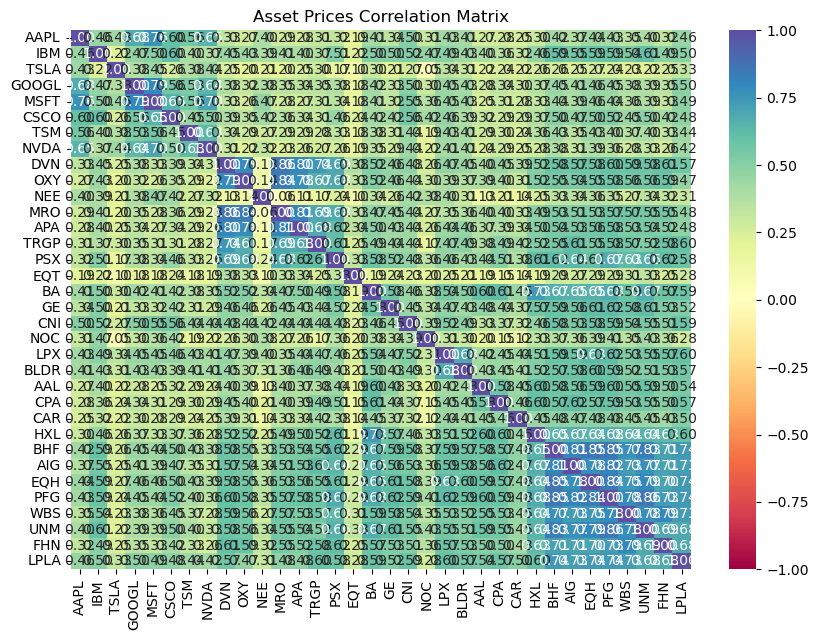

In [68]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(
    asset_mkt_prices_ann_corr_mtrx_df, 
    annot = True, 
    vmin = -1, 
    vmax = 1, 
    fmt = '.2f', 
    cmap = 'Spectral'
).set(
    title='Asset Prices Correlation Matrix'
)

In [26]:
print("Annual average asset returns:")
display(asset_mkt_prices_ann_returns_mean)

Annual average asset returns:


AAPL     0.389610
IBM      0.022839
TSLA     0.962219
GOOGL    0.283177
MSFT     0.341432
CSCO     0.086017
TSM      0.303124
NVDA     0.481984
DVN      0.293540
OXY      0.143259
NEE      0.233977
MRO      0.248336
APA      0.307746
TRGP     0.353046
PSX      0.012996
EQT      0.253545
BA      -0.023974
GE       0.046818
CNI      0.155221
NOC      0.126566
LPX      0.320372
BLDR     0.450837
AAL     -0.015977
CPA      0.079541
CAR      0.886624
HXL      0.059422
BHF      0.174175
AIG      0.135840
EQH      0.208461
PFG      0.143132
WBS      0.070707
UNM      0.071078
FHN      0.166821
LPLA     0.344292
dtype: float64

___
### Efficient Frontier Computation

In [27]:
# Determine the efficient frontier components
efficient_frontier_df = qm.mpt_qa_get_efficient_frontier(asset_prices_df, asset_mkt_prices_ann_returns_mean, asset_mkt_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.shape)

print("Print random 5 rows of Efficient Frontier sample points")
display(efficient_frontier_df.sample(5))

Efficient Frontier DataFrame:


(10000, 37)

Print random 5 rows of Efficient Frontier sample points


,Returns,Volatility,SharpeRatio,AAPL_W,IBM_W,TSLA_W,GOOGL_W,MSFT_W,CSCO_W,TSM_W,...,CAR_W,HXL_W,BHF_W,AIG_W,EQH_W,PFG_W,WBS_W,UNM_W,FHN_W,LPLA_W
2,0.269948,5.637388,0.042564,0.019525,0.004312,0.038270,0.021935,0.055064,0.021160,0.028890,...,0.061272,0.061068,0.026311,0.017504,0.055712,0.028560,0.000032,0.003036,0.029159,0.015088
9262,0.234297,5.025783,0.040650,0.032506,0.035967,0.002632,0.054751,0.005767,0.043602,0.046378,...,0.053829,0.027730,0.036916,0.009940,0.041516,0.051894,0.045221,0.001955,0.013812,0.051527
3856,0.191953,5.217391,0.031041,0.028146,0.047376,0.017835,0.009399,0.024974,0.052493,0.030970,...,0.013563,0.052962,0.049708,0.042406,0.052915,0.002149,0.055355,0.011844,0.023454,0.024962
4042,0.214546,5.067319,0.036419,0.018380,0.014073,0.006384,0.047349,0.028480,0.026916,0.033256,...,0.024339,0.039995,0.017017,0.042220,0.010762,0.026986,0.040029,0.035986,0.041157,0.020806
713,0.259245,5.430841,0.042212,0.041475,0.038631,0.043939,0.013865,0.014928,0.018152,0.050926,...,0.050678,0.039356,0.044955,0.001381,0.042014,0.038692,0.041447,0.007129,0.045546,0.031032


In [28]:
# Select the following portfolio allocations:
# (1) Based on the "minimum" risk
# (2) Based on the "maximum" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_volatility, portfolio_opt_sharpe_ratio = qm.mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Volatility Point:")
display(portfolio_max_volatility)
print("\nEfficient Frontier: Opt Sharpe Ratio Volatility Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.241947
Volatility     4.703500
SharpeRatio    0.045062
AAPL_W         0.042343
IBM_W          0.046292
TSLA_W         0.052376
GOOGL_W        0.019311
MSFT_W         0.051526
CSCO_W         0.042508
TSM_W          0.039351
NVDA_W         0.043072
DVN_W          0.038118
OXY_W          0.026925
NEE_W          0.055616
MRO_W          0.005308
APA_W          0.006520
TRGP_W         0.030122
PSX_W          0.029283
EQT_W          0.037572
BA_W           0.005161
GE_W           0.001783
CNI_W          0.018369
NOC_W          0.058324
LPX_W          0.010201
BLDR_W         0.012793
AAL_W          0.010888
CPA_W          0.041222
CAR_W          0.001832
HXL_W          0.019966
BHF_W          0.001901
AIG_W          0.041139
EQH_W          0.019303
PFG_W          0.027898
WBS_W          0.056892
UNM_W          0.046804
FHN_W          0.023529
LPLA_W         0.035752
Name: 5851, dtype: float64


Efficient Frontier: Max Volatility Point:


Returns        0.247923
Volatility     6.125947
SharpeRatio    0.035574
AAPL_W         0.007071
IBM_W          0.027896
TSLA_W         0.038228
GOOGL_W        0.009694
MSFT_W         0.055541
CSCO_W         0.017917
TSM_W          0.004432
NVDA_W         0.053947
DVN_W          0.017012
OXY_W          0.030750
NEE_W          0.012316
MRO_W          0.073649
APA_W          0.082152
TRGP_W         0.035982
PSX_W          0.017232
EQT_W          0.004782
BA_W           0.048449
GE_W           0.027909
CNI_W          0.001266
NOC_W          0.006620
LPX_W          0.003150
BLDR_W         0.004508
AAL_W          0.062281
CPA_W          0.060261
CAR_W          0.045289
HXL_W          0.000814
BHF_W          0.056834
AIG_W          0.026286
EQH_W          0.001252
PFG_W          0.039097
WBS_W          0.013414
UNM_W          0.032619
FHN_W          0.065721
LPLA_W         0.015626
Name: 6071, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Volatility Point:


Returns        0.308564
Volatility     5.030664
SharpeRatio    0.055373
AAPL_W         0.016529
IBM_W          0.019770
TSLA_W         0.050339
GOOGL_W        0.060407
MSFT_W         0.063220
CSCO_W         0.056850
TSM_W          0.018690
NVDA_W         0.057708
DVN_W          0.038361
OXY_W          0.020833
NEE_W          0.061942
MRO_W          0.014744
APA_W          0.023481
TRGP_W         0.009881
PSX_W          0.021720
EQT_W          0.028063
BA_W           0.007884
GE_W           0.054671
CNI_W          0.027271
NOC_W          0.016574
LPX_W          0.006325
BLDR_W         0.046912
AAL_W          0.012954
CPA_W          0.015251
CAR_W          0.063170
HXL_W          0.006523
BHF_W          0.021177
AIG_W          0.000215
EQH_W          0.029924
PFG_W          0.007623
WBS_W          0.002842
UNM_W          0.043212
FHN_W          0.021040
LPLA_W         0.053896
Name: 3021, dtype: float64

In [29]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the sharpe ratio points)
scatter = hv.Scatter(
    (
        efficient_frontier_df['Volatility'], 
        efficient_frontier_df['Returns'], 
        efficient_frontier_df.loc[:,'SharpeRatio']),
    'Volatility',
    ['Return', 'Sharpe Ratio'],
)
max_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_volatility = hv.Scatter([(portfolio_max_volatility[1],portfolio_max_volatility[0])])

scatter.opts(title="Efficient Frontier + Min/Max/Opt Sharpe Ratio Selections", color='Sharpe Ratio', width=1000, height=600, colorbar=True, padding=0.1) *\
max_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_volatility.opts(color='red', line_color='black', size=15)


:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

### Visualization for: "mpt_performance_eval.py"

In [30]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_min_volatility)
portfolio_max_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_max_volatility)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_opt_sharpe_ratio)

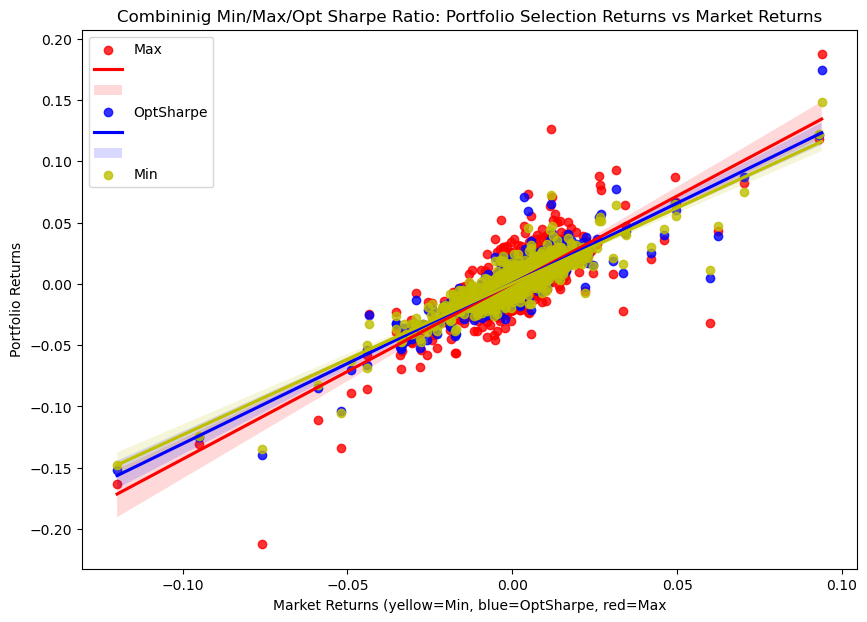

In [31]:
plt.subplots(figsize=(10,7))

x_df = market_df.reset_index(drop=True)
y_df = portfolio_max_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MaxVol"]
sns.regplot(x="Market", y="MaxVol", data=z_df, color='r')

y_df = portfolio_opt_sharpe_ratio_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "OptSharpe"]
sns.regplot(x="Market", y="OptSharpe", data=z_df, color='b')

y_df = portfolio_min_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MinReturns"]
sns.regplot(x="Market", y="MinReturns", data=z_df, color='y')

plt.xlabel("Market Returns (yellow=Min, blue=OptSharpe, red=Max")
plt.ylabel("Portfolio Returns")
plt.legend(["Max", "", "", "OptSharpe", "", "", "Min"])
plt.title("Combininig Min/Max/Opt Sharpe Ratio: Portfolio Selection Returns vs Market Returns")

plt.show()

In [32]:
portfolio_min_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_min_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Minimum / Lowest risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [33]:
portfolio_opt_sharpe_ratio_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Balanced; Optimal Sharpe Ratio Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [34]:
portfolio_max_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_max_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_max_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Max return, High risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [35]:
asset_prices_test_beg_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_historical_days_percent, :]).drop('SP500_index', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_days_total-1, :]).drop('SP500_index', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
2022-04-07,172.139999,128.550003,352.420013,135.888504,301.369995,54.630001,100.519997,242.080002,60.23,57.68,...,251.679993,55.389999,49.299999,61.66,30.860001,73.059998,50.189999,31.43,23.43,188.539993


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,CAR,HXL,BHF,AIG,EQH,PFG,WBS,UNM,FHN,LPLA
2022-10-24,149.449997,132.690002,211.25,102.519997,247.25,43.540001,61.290001,125.989998,75.239998,70.830002,...,220.830002,57.869999,52.880001,54.349998,28.91,80.029999,52.23,44.139999,24.200001,240.660004


___
### Monte-Carlo Dataframe Weights List

In [36]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_weights = mpt.mpt_pe_get_mc_weights(portfolio_min_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt.mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)
portfolio_mc_max_weights = mpt.mpt_pe_get_mc_weights(portfolio_max_weights)

In [37]:
investment_pnl_min = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]
investment_pnl_max = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_weights))[0][0]

print("Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:")
display(investment_pnl_min)
display(investment_pnl_opt_sharpe_ratio)
display(investment_pnl_max)

Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:


9314.610012054443

9059.759994506836

9526.679998397827

### Run Monte-Carlo Simulations
---
* Compute expected Returns, and 
* Compare against realized returns

In [38]:
print("Number of MC runs:", mpt.num_mc_runs)

Number of MC runs: 1200


In [39]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False)

In [40]:
# Arrange Monte-Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt.mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [41]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the minimum risk portfolio weights
# Run 500 samples.
MC_min_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min)")
MC_min_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Min)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-17  142.410004     0.029123  121.519997     0.012329  219.350006   
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-17     0.070052   99.970001     0.035315  237.529999     0.039246   
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   

            ...        PFG                     WBS                     UNM  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-17  ...  78.220001     0.021016  48.799999     0.022418  42.139999   
2022-10-18  ...  79.879997     0.021222  49.549999     0.015369  43.060001   
2022-10-19  ...  78.769997    -0.013896  48.549999    -0.020182  43.099998   
2022-10-20  ...  77.559998    -0.015361  49.529999     0.020185  42.459999   
2022-10-21  ...  78.839996     0.016503  50.869999     0.027054  43.590000   

                               FHN                     LPLA               
           daily_return      close daily_return       close daily_return  
Date                                                                      
2022-10-17     0.008858  23.950001     0.007573  238.000000    -0.002264  
2022-10-18     0.021832  24.000000     0.002088  242.100006     0.017227  
2022-10-19     0.000929  24.070000     0.002917  237.059998    -0.020818  
2022-10-20    -0.014849  24.040001    -0.001246  235.270004    -0.007551  
2022-10-21     0.026613  24.190001     0.006240  238.520004     0.013814  

[5 rows x 68 columns]

In [42]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (min)
MC_min_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.001488,0.993963,1.001993,1.002725,0.998716,0.994714,1.001690,0.995438,0.999135,1.003665,...,0.994327,0.997074,1.010871,1.010414,0.989814,0.989458,1.000349,1.006656,1.002581,0.987813
2,1.001092,0.991520,0.998262,1.006761,0.998531,0.993142,0.996692,0.999054,1.005637,1.007731,...,0.994701,0.994609,1.009835,1.009976,0.986702,0.978025,0.992666,1.006623,1.002986,0.995755
3,0.999807,0.989431,0.997076,1.006044,1.001173,0.990236,0.995581,0.995067,1.014440,1.004477,...,0.997515,0.989566,1.011274,1.005635,0.991621,0.979674,0.989819,1.013569,1.007167,0.993899
4,0.997148,0.987250,0.997976,0.999870,0.994260,0.992703,0.986635,0.985692,1.025602,1.007825,...,0.995948,0.991013,1.004557,0.998406,0.991762,0.979918,0.982686,1.001307,1.002469,0.982537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,0.897110,0.939419,0.840293,0.892716,0.971130,1.041671,0.901043,0.911914,0.979709,0.907065,...,0.920549,0.938239,1.088097,0.977354,1.026623,1.024970,0.900536,1.023382,1.116938,0.911629
135,0.901830,0.932735,0.846881,0.892751,0.971552,1.036589,0.900683,0.921909,0.974944,0.900968,...,0.928744,0.932093,1.086090,0.979257,1.030643,1.024996,0.894843,1.019470,1.123447,0.913177
136,0.898985,0.931019,0.842470,0.887388,0.983569,1.026862,0.907687,0.924822,0.968520,0.899061,...,0.928496,0.935721,1.085398,0.980775,1.023919,1.010980,0.892841,1.010494,1.132368,0.918647
137,0.892126,0.935373,0.833200,0.889243,0.984336,1.028410,0.905371,0.922976,0.965866,0.910793,...,0.921283,0.937854,1.093483,0.984675,1.018110,1.008671,0.899648,1.014964,1.139370,0.916705


In [43]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the maximum return risk-tolerant portfolio weights
# Run 500 samples.
MC_max_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max)")
MC_max_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Max)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-17  142.410004     0.029123  121.519997     0.012329  219.350006   
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-17     0.070052   99.970001     0.035315  237.529999     0.039246   
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   

            ...        PFG                     WBS                     UNM  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-17  ...  78.220001     0.021016  48.799999     0.022418  42.139999   
2022-10-18  ...  79.879997     0.021222  49.549999     0.015369  43.060001   
2022-10-19  ...  78.769997    -0.013896  48.549999    -0.020182  43.099998   
2022-10-20  ...  77.559998    -0.015361  49.529999     0.020185  42.459999   
2022-10-21  ...  78.839996     0.016503  50.869999     0.027054  43.590000   

                               FHN                     LPLA               
           daily_return      close daily_return       close daily_return  
Date                                                                      
2022-10-17     0.008858  23.950001     0.007573  238.000000    -0.002264  
2022-10-18     0.021832  24.000000     0.002088  242.100006     0.017227  
2022-10-19     0.000929  24.070000     0.002917  237.059998    -0.020818  
2022-10-20    -0.014849  24.040001    -0.001246  235.270004    -0.007551  
2022-10-21     0.026613  24.190001     0.006240  238.520004     0.013814  

[5 rows x 68 columns]

In [44]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (max)
MC_max_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.989505,0.988652,0.994246,0.998520,1.001681,1.001628,1.002623,1.006040,0.984538,0.991520,...,1.001854,0.994516,1.008208,0.999112,1.001047,1.002360,0.998137,1.006025,0.996154,1.013824
2,0.988040,0.988503,1.005310,0.987389,1.020307,1.005516,0.999533,1.012871,0.992401,0.992757,...,1.002053,0.996362,0.997656,0.990898,1.002701,0.997799,0.996348,1.003402,1.002788,1.011092
3,0.980292,0.986129,0.993785,0.986656,1.020539,1.012474,1.002421,1.022131,0.997109,0.989639,...,0.996868,0.994034,1.003998,0.986623,1.015772,0.993068,0.999470,0.994393,1.000429,1.009060
4,0.975122,0.995439,0.989970,0.977936,1.025895,1.006097,1.001762,1.026046,0.997960,0.991704,...,1.005253,1.001858,0.997378,0.988640,1.010357,0.994893,1.003338,0.996267,0.997435,0.998414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,0.933641,1.175105,1.170571,1.019697,1.271231,0.986734,0.987459,0.995536,0.891498,0.993875,...,1.010976,1.053597,0.867974,1.002208,1.048781,1.240903,1.005950,0.952091,0.905817,0.941038
135,0.927418,1.184230,1.161877,1.020298,1.267571,0.983119,0.974725,0.989948,0.897250,0.999242,...,1.007285,1.061228,0.875446,1.004532,1.056262,1.235845,1.012384,0.942177,0.910990,0.930194
136,0.927446,1.191841,1.171341,1.020244,1.261136,0.965614,0.974453,1.001770,0.896648,0.994083,...,1.000597,1.066310,0.881194,1.007035,1.052702,1.236977,1.019950,0.939635,0.910308,0.927111
137,0.926334,1.206333,1.175185,1.015573,1.262034,0.967011,0.975902,1.002966,0.905494,1.002192,...,1.002277,1.061394,0.886390,1.005356,1.048342,1.246452,1.018261,0.939500,0.916493,0.925402


In [45]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the optimal risk-return Sharpe Ratio of the portfolio
# Run 500 samples.

MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Opt Sharpe)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-17  142.410004     0.029123  121.519997     0.012329  219.350006   
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-17     0.070052   99.970001     0.035315  237.529999     0.039246   
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   

            ...        PFG                     WBS                     UNM  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-17  ...  78.220001     0.021016  48.799999     0.022418  42.139999   
2022-10-18  ...  79.879997     0.021222  49.549999     0.015369  43.060001   
2022-10-19  ...  78.769997    -0.013896  48.549999    -0.020182  43.099998   
2022-10-20  ...  77.559998    -0.015361  49.529999     0.020185  42.459999   
2022-10-21  ...  78.839996     0.016503  50.869999     0.027054  43.590000   

                               FHN                     LPLA               
           daily_return      close daily_return       close daily_return  
Date                                                                      
2022-10-17     0.008858  23.950001     0.007573  238.000000    -0.002264  
2022-10-18     0.021832  24.000000     0.002088  242.100006     0.017227  
2022-10-19     0.000929  24.070000     0.002917  237.059998    -0.020818  
2022-10-20    -0.014849  24.040001    -0.001246  235.270004    -0.007551  
2022-10-21     0.026613  24.190001     0.006240  238.520004     0.013814  

[5 rows x 68 columns]

In [46]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns of the optimal (balanced) Sharpe Ratio
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.001014,1.001702,1.000468,1.003068,1.003866,0.997967,0.990784,0.991113,0.991443,0.995540,...,0.996899,1.002309,0.996453,1.001489,0.996052,1.000105,0.996084,0.998908,0.997126,1.006108
2,0.998295,0.986621,0.999344,1.009443,1.010584,1.002037,0.994948,1.001281,0.994424,0.997263,...,0.999434,1.000027,0.985924,0.995152,0.990795,0.995877,0.999018,1.002130,1.000744,1.003873
3,0.998814,0.982139,1.003266,1.010233,1.003546,1.005912,0.982753,0.994271,1.007113,0.995144,...,0.997902,0.998493,0.981255,0.984051,0.985667,0.995530,1.006741,0.993375,0.983039,1.014001
4,0.989012,0.976212,1.004924,1.009664,1.007008,1.008067,0.983578,0.987388,1.012541,1.000933,...,0.996215,0.992596,0.978367,0.983868,0.982584,1.000107,1.000969,1.000500,0.975751,1.017866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,0.967905,0.885740,0.981971,1.082984,1.000832,0.974203,0.916831,0.889169,0.895689,1.008302,...,0.946341,0.862470,0.834548,1.013385,0.764029,0.890290,0.901736,0.905328,0.948349,0.962943
135,0.962310,0.883944,0.984256,1.082250,1.008065,0.979760,0.920160,0.888095,0.887917,0.998264,...,0.947676,0.858858,0.834246,1.019038,0.766927,0.890682,0.896366,0.902565,0.940223,0.961934
136,0.962148,0.883062,0.985460,1.085598,1.005815,0.977477,0.921007,0.888333,0.882527,0.996504,...,0.944384,0.873922,0.832584,1.004815,0.761888,0.898491,0.902830,0.902739,0.936737,0.961291
137,0.964112,0.880251,0.986239,1.087232,1.010266,0.975779,0.916989,0.874914,0.883494,0.999652,...,0.948907,0.864006,0.835046,0.997282,0.754788,0.900635,0.905963,0.906749,0.932057,0.971711


### 4. Visualizations

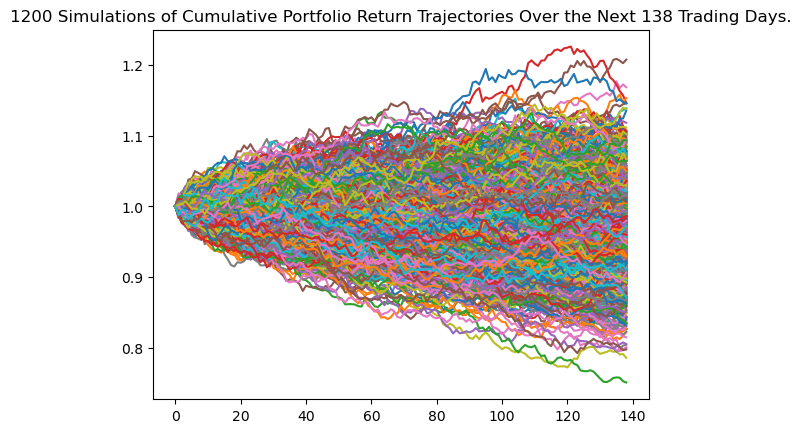

In [47]:
# Visualize the 1 year Monte Carlo simulation by creating an overlay line plot

line_plot_min_portfolio_plot = MC_min_portfolio.plot_simulation()

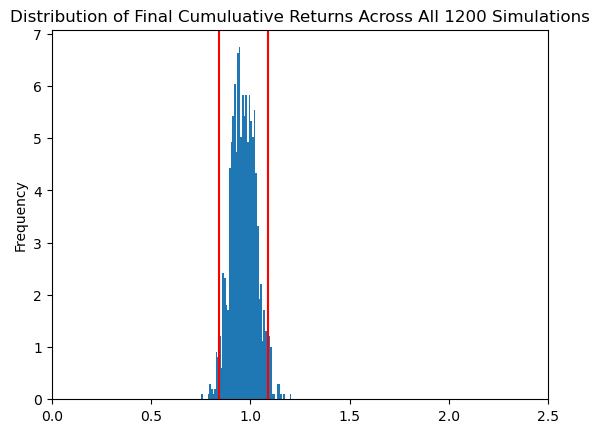

In [48]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_min_portfolio_plot = MC_min_portfolio.plot_distribution()

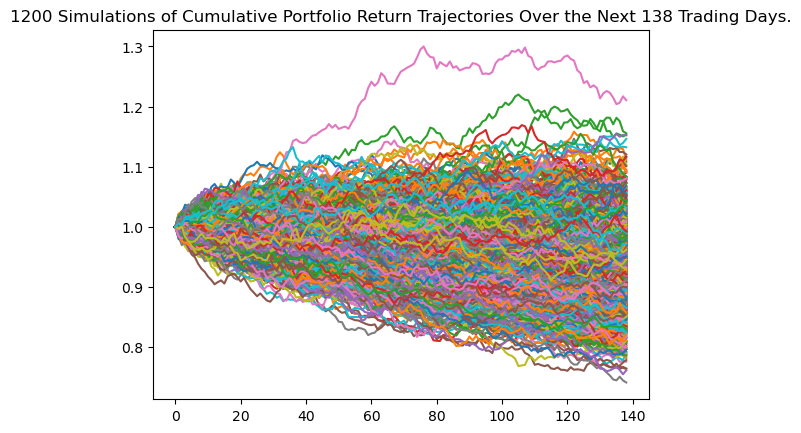

In [49]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

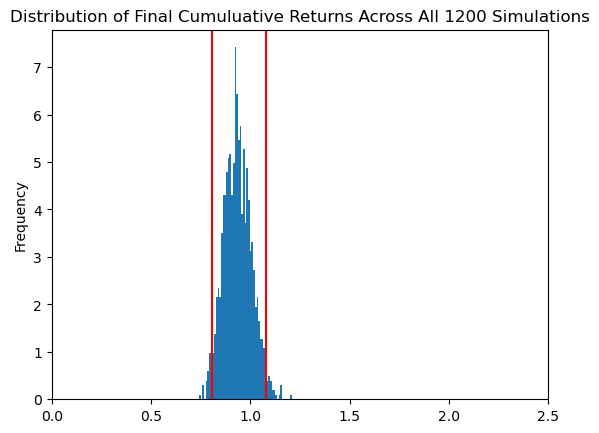

In [50]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

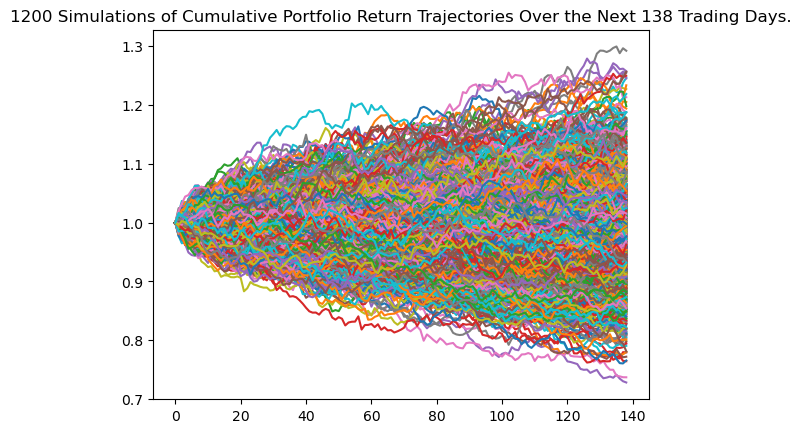

In [51]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_portfolio_plot = MC_max_portfolio.plot_simulation()

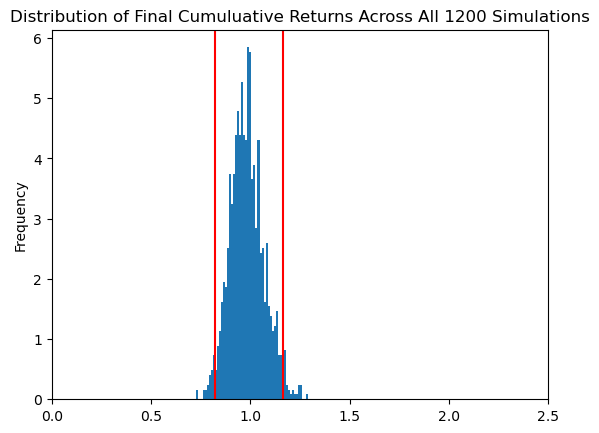

In [52]:
# Visualize the probability distribution of the 1 year Monte-Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_max_portfolio_plot = MC_max_portfolio.plot_distribution()

In [53]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_min_portfolio_weight = MC_min_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_min_portfolio_weight)

count           1200.000000
mean               0.965264
std                0.062859
min                0.751487
25%                0.920940
50%                0.963517
75%                1.008702
max                1.207000
95% CI Lower       0.843486
95% CI Upper       1.091151
Name: 138, dtype: float64


In [54]:
# Generate summary statistics from the 1 year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           1200.000000
mean               0.935998
std                0.068644
min                0.741137
25%                0.887052
50%                0.931774
75%                0.982631
max                1.210669
95% CI Lower       0.808778
95% CI Upper       1.078780
Name: 138, dtype: float64


In [55]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_max_portfolio_weight = MC_max_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_max_portfolio_weight)

count           1200.000000
mean               0.982439
std                0.085262
min                0.728118
25%                0.926185
50%                0.980024
75%                1.035931
max                1.292491
95% CI Lower       0.820984
95% CI Upper       1.163095
Name: 138, dtype: float64


In [56]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${mpt.initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [57]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN portfolio

# Get the lower and upper CI values
ci_lower_95per = table_min_portfolio_weight[8]
ci_upper_95per = table_min_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current minimum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_min:0.2f}")


There is a 95% chance that the current minimum portfolio value of $10000.00, will end within the range of $8434.86 and $10911.51.
The actual realized value of the portfolio was $9314.61


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# Get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltive returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of $10000.00, will end within the range of $8087.78 and $10787.80.
The actual realized value of the portfolio was $9059.76


In [59]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX portfolio

# Get the lower and upper CI values
ci_lower_95per = table_max_portfolio_weight[8]
ci_upper_95per = table_max_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current maximum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_max:0.2f}")


There is a 95% chance that the current maximum portfolio value of $10000.00, will end within the range of $8209.84 and $11630.95.
The actual realized value of the portfolio was $9526.68


In [60]:
# ending process
end_time = time.process_time()
print("Process time", end_time - start_time)

Process time 76.77035599999999
